# Importing Libraries

In [1]:
import os
import json
import glob
import random
import torch
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageDraw
import matplotlib.patches as patches
from collections import Counter
from tqdm import tqdm


from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision.transforms as T
from ultralytics import YOLO

# Set plot style
sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)

In [2]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision.transforms as T
from ultralytics import YOLO


In [3]:
from scripts.dataset_checker import BDD100K_IndividualFiles_Dataset, visualize_sample

In [4]:
# --- CONFIGURATION (UPDATE THESE PATHS) ---
VAL_IMG_DIR = "dataset/val_images/"   # Path to images
VAL_LBL_DIR = "annotations/val/"            # Path to JSON labels
RCNN_RESULTS = "faster_rcnn_final_results_2.json" # File we created in previous step
YOLO_RESULTS_CSV = "results/bdd_yolo_run_s/results.csv" # Standard YOLO output

In [12]:
def plot_class_distribution(label_dir, limit=1000, save = True ):
    """Scans a subset of JSONs to count object classes"""
    print(f"Scanning {limit} files for class distribution...")
    
    all_labels = []
    json_files = sorted(glob.glob(os.path.join(label_dir, "*.json")))[:limit]
    
    for jf in tqdm(json_files):
        with open(jf, 'r') as f:
            data = json.load(f)
            # Handle different JSON structures
            objs = data.get('frames', [{}])[0].get('objects', []) if 'frames' in data else data.get('labels', [])
            
            for obj in objs:
                if 'box2d' in obj:
                    all_labels.append(obj['category'])
    
    # Count
    counts = Counter(all_labels)
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['Count']).reset_index()
    df = df.rename(columns={'index': 'Class'}).sort_values('Count', ascending=False)
    
    # Plot
    plt.figure(figsize=(14, 6))
    sns.barplot(data=df, x='Class', y='Count', palette='viridis')
    plt.title("Object Class Distribution (Top 1000 Samples)", fontsize=16)
    plt.xticks(rotation=45)

    # Save plot
    if save:
        filename = 'class_distribution_plot.png'
        os.makedirs('output', exist_ok=True)
        plt.savefig(os.path.join('output',filename))
        
    plt.show()

    return df

Scanning 1000 files for class distribution...


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 3199.46it/s]
C:\Users\gsamu\AppData\Local\Temp\ipykernel_12000\567559140.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df, x='Class', y='Count', palette='viridis')


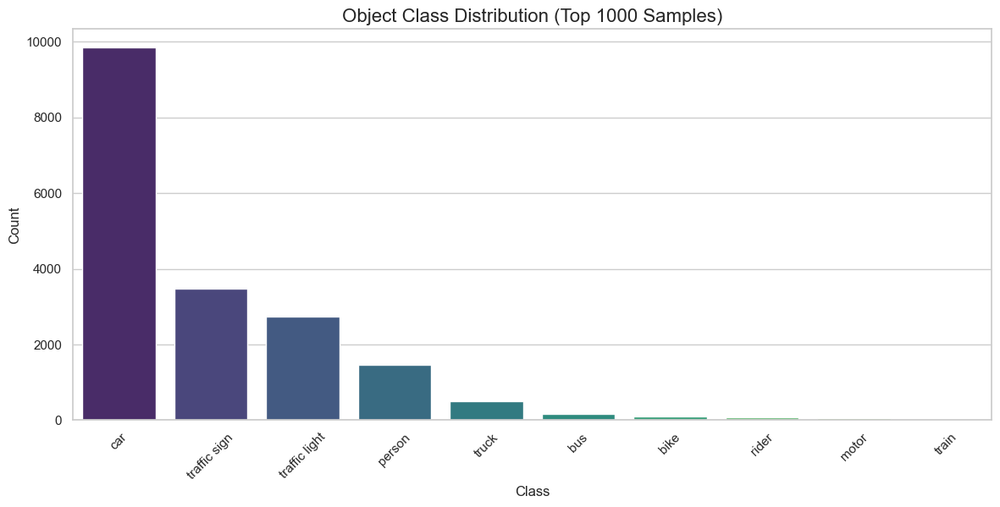

           Class  Count
2            car   9845
0   traffic sign   3475
1  traffic light   2737
5         person   1467
7          truck    495
6            bus    172
8           bike     87
3          rider     65
4          motor     54
9          train      1


In [13]:
# Run it
df_classes = plot_class_distribution(VAL_LBL_DIR, save=True)
print(df_classes)

In [14]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
import math

def visualize_samples(dataset, num_samples=4, add_annotations=False, save=True):
    """
    Displays 'num_samples' random images from the dataset in a grid with 2 columns.
    
    Args:
        dataset: The PyTorch dataset class
        num_samples (int): Number of images to show
        add_annotations (bool): If True, draws class names above boxes
    """
    # 1. Select Random Indices
    total_images = len(dataset)
    num_samples = min(num_samples, total_images) 
    indices = random.sample(range(total_images), num_samples)

    # 2. Setup Grid (Fixed 2 Columns)
    cols = 2
    rows = math.ceil(num_samples / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 6 * rows))
    
    if rows == 1 and cols == 1: axes_flat = [axes]
    elif rows == 1 or cols == 1: axes_flat = axes
    else: axes_flat = axes.flatten()

    # Define Mapping (ID -> Name) matches your train.py
    ID_TO_NAME = {
        0: "Background",
        1: "Pedestrian",
        2: "Rider",
        3: "Car",
        4: "Truck",
        5: "Bus",
        6: "Train",
        7: "Motorcycle",
        8: "Bicycle",
        9: "Traffic Light",
        10: "Traffic Sign"
    }

    for i, idx in enumerate(indices):
        ax = axes_flat[i]
        
        # 3. Get Data
        image, target = dataset[idx]
        boxes = target['boxes']
        labels = target['labels'] # Get labels tensor
        
        # 4. Handle Image Format
        if hasattr(image, 'permute'): 
            img_display = image.permute(1, 2, 0).cpu().numpy()
        else:
            img_display = image 
            
        ax.imshow(img_display)

        # 5. Draw Boxes & Labels
        for k, box in enumerate(boxes):
            x1, y1, x2, y2 = box.cpu().numpy() 
            width = x2 - x1
            height = y2 - y1

            # Draw Box
            rect = patches.Rectangle(
                (x1, y1), width, height, 
                linewidth=2, edgecolor='red', facecolor='none'
            )
            ax.add_patch(rect)

            # Draw Label (Optional)
            if add_annotations:
                label_id = labels[k].item()
                class_name = ID_TO_NAME.get(label_id, str(label_id))
                
                # Add text with a small background box for readability
                ax.text(
                    x1, y1 - 5, class_name, 
                    color='white', fontsize=10, weight='bold',
                    bbox=dict(facecolor='red', alpha=0.5, edgecolor='none', pad=1)
                )

        ax.set_title(f"ID {idx}: {len(boxes)} Objects")
        ax.axis('off')

    # 6. Hide Empty Plots
    for j in range(num_samples, len(axes_flat)):
        axes_flat[j].axis('off')

    plt.tight_layout()

    # Save plot
    if save:
        filename = 'ground_truth_sample.png'
        os.makedirs('output', exist_ok=True)
        plt.savefig(os.path.join('output',filename))

    plt.show()

In [15]:
val_dataset = BDD100K_IndividualFiles_Dataset(
        image_dir="dataset/val_images/", 
        label_dir="annotations/val/"  # Folder containing the 10k jsons
    )

Found 10000 images.


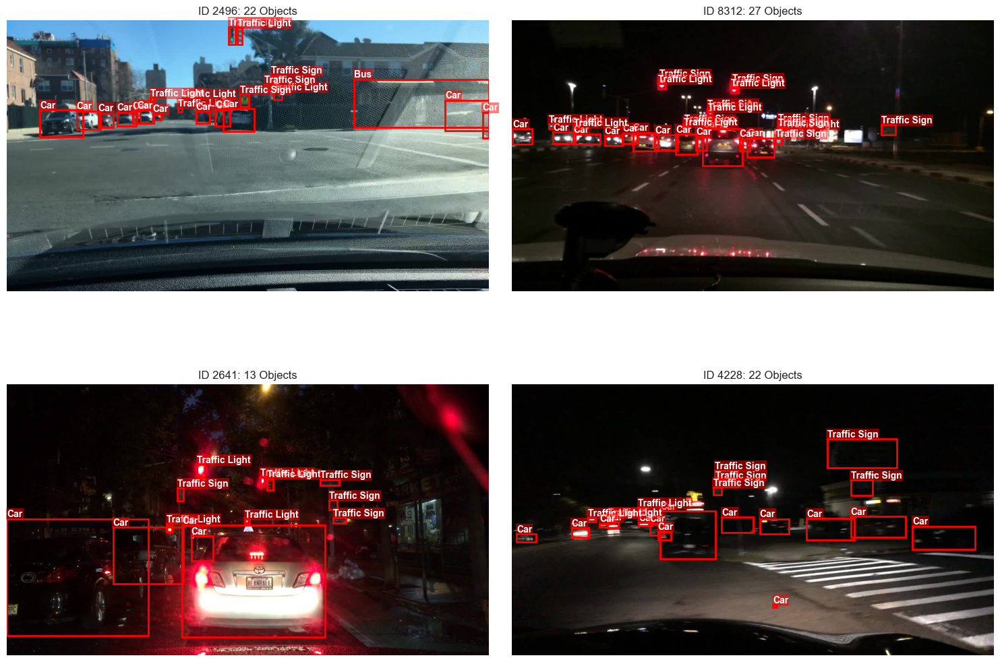

In [16]:
visualize_samples(val_dataset, num_samples=4, add_annotations=True)

In [7]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import json
import os
import glob
import random

In [18]:
def visualize_ground_truth_grid(label_dir, image_dir, save=True, seed = 42):
    # 1. Define the conditions we want to find
    # Format: (Title, check_function)
    targets = {
        "Day / Clear": lambda attr: attr['timeofday'] == 'daytime' and attr['weather'] == 'clear',
        "Night": lambda attr: attr['timeofday'] == 'night',
        "Rainy": lambda attr: attr['weather'] == 'rainy',
        "Snowy": lambda attr: attr['weather'] == 'snowy'
    }
    
    # Storage for found images: {Title: {img_path, boxes, classes}}
    found_samples = {}
    
    # 2. Scan JSONs until we find one of each
    print("Scanning for diverse samples (Day, Night, Rain, Snow)...")
    json_files = sorted(glob.glob(os.path.join(label_dir, "*.json")))
    random.seed(seed) # Fixed seed for reproducibility
    random.shuffle(json_files) # Shuffle to get random samples each time
    
    for jf in json_files:
        # Stop if we found everything
        if len(found_samples) == len(targets):
            break
            
        with open(jf, 'r') as f:
            data = json.load(f)
            
        # Extract Attributes
        attr = data.get('attributes', {})
        if not attr: continue
        
        # Check if this image matches a missing target
        for title, check_fn in targets.items():
            if title not in found_samples and check_fn(attr):
                # Found a match! Save it.
                img_name = os.path.basename(jf).replace('.json', '.jpg')
                img_path = os.path.join(image_dir, img_name)
                
                if not os.path.exists(img_path): continue
                
                # Extract Boxes
                boxes = []
                objs = data.get('frames', [{}])[0].get('objects', []) if 'frames' in data else data.get('labels', [])
                for obj in objs:
                    if 'box2d' in obj:
                        b = obj['box2d']
                        # x, y, w, h
                        boxes.append([b['x1'], b['y1'], b['x2']-b['x1'], b['y2']-b['y1'], obj['category']])
                
                found_samples[title] = {'path': img_path, 'boxes': boxes, 'attr': attr}
                break

    # 3. Plotting
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    for i, (title, target_key) in enumerate(targets.items()):
        ax = axes[i]
        
        if title in found_samples:
            sample = found_samples[title]
            image = Image.open(sample['path'])
            ax.imshow(image)
            
            # Draw GT Boxes
            for box in sample['boxes']:
                x, y, w, h, cat = box
                # Color code: Car=Blue, Pedestrian=Red, Traffic Light=Yellow, Others=Green
                c = 'cyan'
                if cat == 'car': c = 'blue'
                elif cat == 'pedestrian': c = 'red'
                elif cat == 'traffic light': c = 'yellow'
                
                rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor=c, facecolor='none')
                ax.add_patch(rect)
            
            # Title with file info
            tod = sample['attr'].get('timeofday', '?')
            wea = sample['attr'].get('weather', '?')
            ax.set_title(f"{title}\n({tod}, {wea})")
        else:
            ax.text(0.5, 0.5, "Not Found", ha='center', va='center')
            ax.set_title(title)
        
        ax.axis('off')

    plt.suptitle(f"Ground Truth Samples from BDD100K Validation Set", fontsize=16)
    plt.tight_layout()

    # Save plot
    if save:
        filename = 'diverse_sample.png'
        os.makedirs('output', exist_ok=True)
        plt.savefig(os.path.join('output',filename))
        
    plt.show()


Scanning for diverse samples (Day, Night, Rain, Snow)...


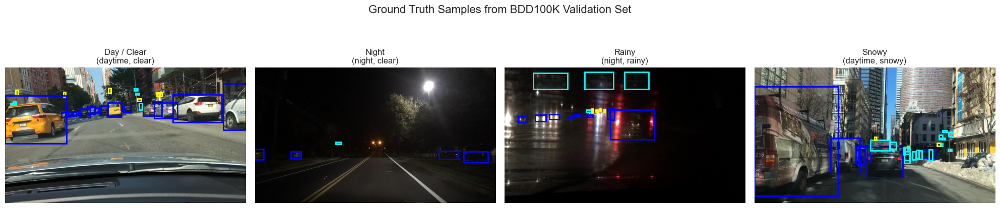

In [19]:
visualize_ground_truth_grid(VAL_LBL_DIR, VAL_IMG_DIR)

Scanning for diverse samples (Day, Night, Rain, Snow)...


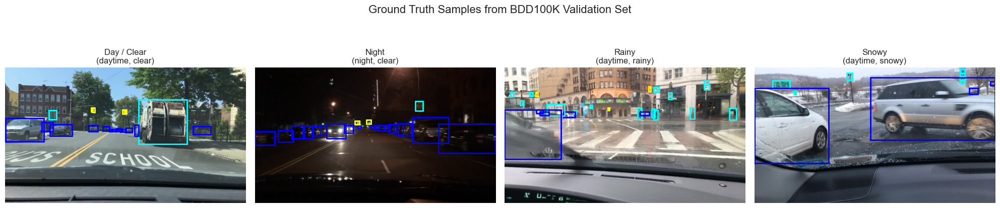

In [21]:
visualize_ground_truth_grid(VAL_LBL_DIR, VAL_IMG_DIR,save=False, seed = 2)

Scanning for diverse samples (Day, Night, Rain, Snow)...


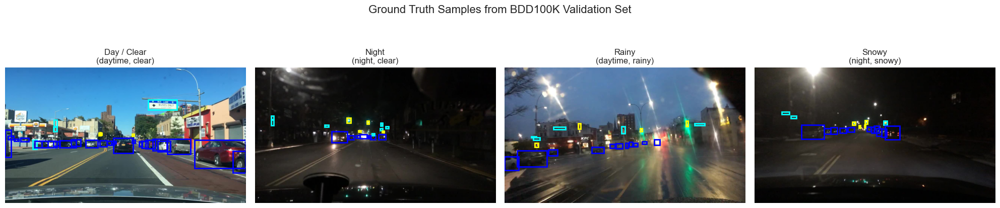

In [11]:
visualize_ground_truth_grid(VAL_LBL_DIR, VAL_IMG_DIR, seed = 40)

In [22]:
def plot_time_of_day(label_dir, save=True, limit=2000):
    print(f"Scanning {limit} files for time of day...")
    times = []
    json_files = sorted(glob.glob(os.path.join(label_dir, "*.json")))[:limit]
    
    for jf in json_files:
        with open(jf, 'r') as f:
            data = json.load(f)
            tod = data.get('attributes', {}).get('timeofday', 'Unknown')
            times.append(tod)
            
    # Plot
    counts = Counter(times)
    plt.figure(figsize=(8, 8))
    plt.pie(counts.values(), labels=counts.keys(), autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
    plt.title("Time of Day Distribution")

    # Save plot
    if save:
        filename = 'time_of_day_distribution.png'
        os.makedirs('output', exist_ok=True)
        plt.savefig(os.path.join('output',filename))
        
    plt.show()

Scanning 2000 files for time of day...


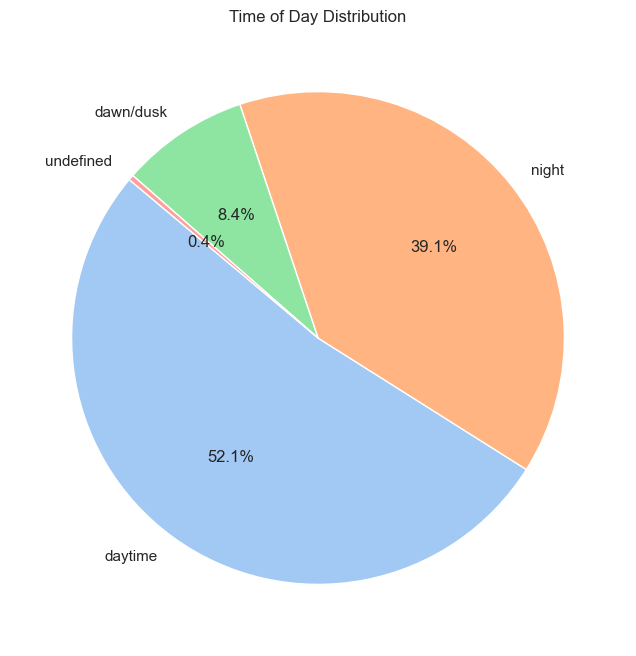

In [23]:
plot_time_of_day(VAL_LBL_DIR)

In [87]:
# 1. Load Faster R-CNN Results
rcnn_data = {}
if os.path.exists(RCNN_RESULTS):
    with open(RCNN_RESULTS, 'r') as f:
        rcnn_data = json.load(f)
else:
    print("Faster R-CNN results file not found. Using placeholder data.")
    rcnn_data = {"mAP_50_overall": 0.0, "fps": 0.0, "latency_ms": 0.0}

# 2. Load YOLO Results
yolo_map = 0.0
if os.path.exists(YOLO_RESULTS_CSV):
    yolo_df = pd.read_csv(YOLO_RESULTS_CSV)
    # Get the mAP50 from the last epoch (strip whitespace from columns)
    yolo_df.columns = [c.strip() for c in yolo_df.columns]
    yolo_map = yolo_df.iloc[-1]['metrics/mAP50(B)']
else:
    print("YOLO results file not found.")

# 3. Create Comparison Table (Manually fill YOLO FPS based on your previous test)
# Replace '45.0' with your actual YOLO FPS from the terminal
comparison_df = pd.DataFrame([
    {"Model": "Faster R-CNN", "mAP@50": rcnn_data['mAP_50_overall'], "FPS": rcnn_data['fps'], "Latency (ms)": rcnn_data['latency_ms']},
    {"Model": "YOLOv8 (Small)", "mAP@50": yolo_map, "FPS": 110.0, "Latency (ms)": 9.0} # <--- Update with your real YOLO numbers
])

# 4. Plot Side-by-Side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy Plot
sns.barplot(data=comparison_df, x="Model", y="mAP@50", ax=axes[0], palette="Blues")
axes[0].set_title("Detection Accuracy (mAP@50)", fontsize=14)
axes[0].set_ylim(0, 1.0)

# Speed Plot
sns.barplot(data=comparison_df, x="Model", y="FPS", ax=axes[1], palette="Reds")
axes[1].set_title("Inference Speed (FPS)", fontsize=14)
save=True
# Save plot
    if save:
        filename = 'model_comparison_results.png'
        os.makedirs('output', exist_ok=True)
        plt.savefig(os.path.join('output',filename))

plt.show()
display(comparison_df)

IndentationError: unexpected indent (335774703.py, line 40)

In [31]:

# --- SETUP MODELS ---
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# 1. Load YOLO
print("Loading YOLO...")
yolo_model = YOLO("results/bdd_yolo_run_s2/weights/best.pt")

# 2. Load Faster R-CNN
print("Loading Faster R-CNN...")
rcnn_model = fasterrcnn_resnet50_fpn(weights=None)
rcnn_model.roi_heads.box_predictor = FastRCNNPredictor(rcnn_model.roi_heads.box_predictor.cls_score.in_features, 11)
# Update path to your saved .pth file
rcnn_checkpoint = "models/bdd_model_epoch_2.pth" 
if os.path.exists(rcnn_checkpoint):
    rcnn_model.load_state_dict(torch.load(rcnn_checkpoint, map_location=device))    
rcnn_model.to(device)
rcnn_model.eval()

Loading YOLO...
Loading Faster R-CNN...


C:\Users\gsamu\AppData\Local\Temp\ipykernel_12000\3794819882.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  rcnn_model.load_state_dict(torch.load(rcnn_checkpoint, map_

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [33]:
def visualize_comparison(img_path):
    image = Image.open(img_path).convert("RGB")
    filename = os.path.basename(img_path) # <--- Extract filename
    
    print(f"📸 Processing Image: {filename}") # <--- Print it to console

    # --- YOLO PREDICTION ---
    # conf=0.25 is standard. You can lower it to 0.1 to check for "weak" detections.
    yolo_results = yolo_model(image, verbose=False, conf=0.25)
    yolo_plot = yolo_results[0].plot() 
    
    # --- FASTER R-CNN PREDICTION ---
    transform = T.Compose([T.ToTensor()])
    img_tensor = transform(image).to(device).unsqueeze(0)
    with torch.no_grad():
        preds = rcnn_model(img_tensor)[0]
    
    # Draw RCNN Boxes
    rcnn_img = image.copy()
    draw = ImageDraw.Draw(rcnn_img)
    
    # Filter R-CNN predictions
    has_detection = False
    for i in range(len(preds['boxes'])):
        score = preds['scores'][i].item()
        if score > 0.5: # Threshold
            has_detection = True
            box = preds['boxes'][i].cpu().numpy()
            label = preds['labels'][i].item()
            
            # Draw Box
            draw.rectangle(box, outline="red", width=3)
            draw.text((box[0], box[1]), f"{score:.2f}", fill="red")
            
    # --- DISPLAY ---
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    
    ax[0].imshow(yolo_plot)
    ax[0].set_title(f"YOLOv8-Small\nFile: {filename}", fontsize=14)
    ax[0].axis('off')
    
    ax[1].imshow(rcnn_img)
    ax[1].set_title(f"Faster R-CNN (ResNet50)\nFile: {filename}", fontsize=14)
    ax[1].axis('off')
    
    plt.tight_layout()
    plt.show()


📸 Processing Image: bd70577b-57a066d8.jpg


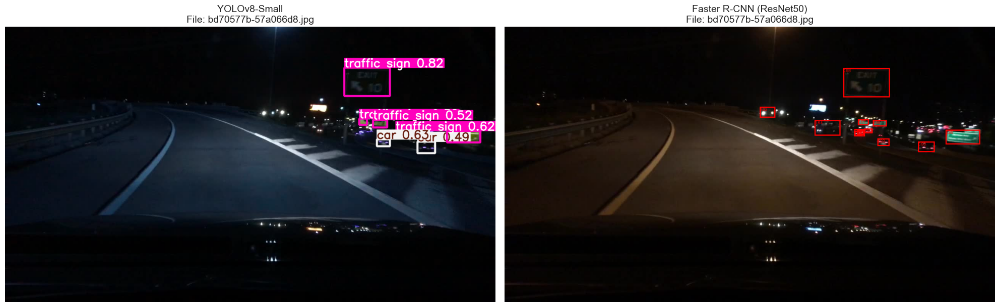

In [83]:
# Pick a random image from validation
random_img = random.choice(glob.glob(os.path.join(VAL_IMG_DIR, "*.jpg")))
visualize_comparison(random_img)

📸 Processing Image: bd3bd3ab-79f6d287.jpg


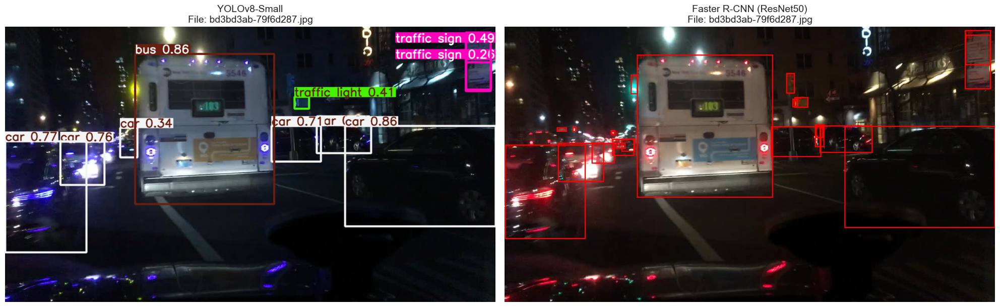

In [18]:
# Pick a random image from validation
random_img = random.choice(glob.glob(os.path.join(VAL_IMG_DIR, "*.jpg")))
visualize_comparison(random_img)

📸 Processing Image: ba112f29-5452cd9f.jpg


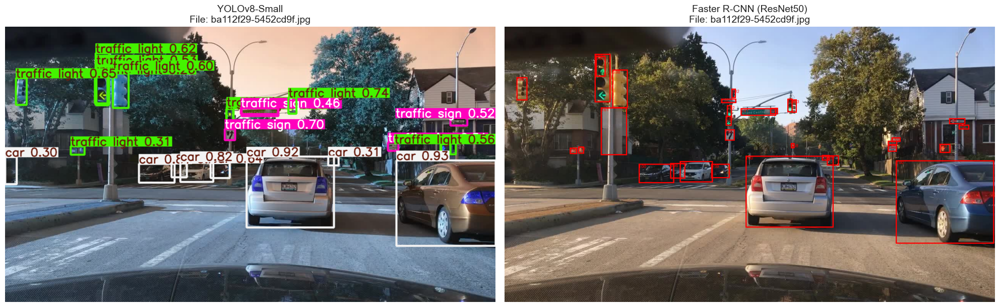

In [19]:
# Pick a random image from validation
random_img = random.choice(glob.glob(os.path.join(VAL_IMG_DIR, "*.jpg")))
visualize_comparison(random_img)

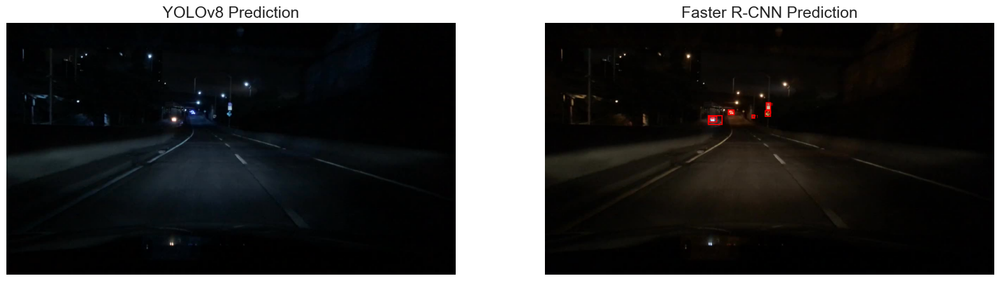

In [20]:
# Pick a random image from validation
random_img = random.choice(glob.glob(os.path.join(VAL_IMG_DIR, "*.jpg")))
visualize_comparison(random_img)

📸 Processing Image: b555a636-270a146b.jpg


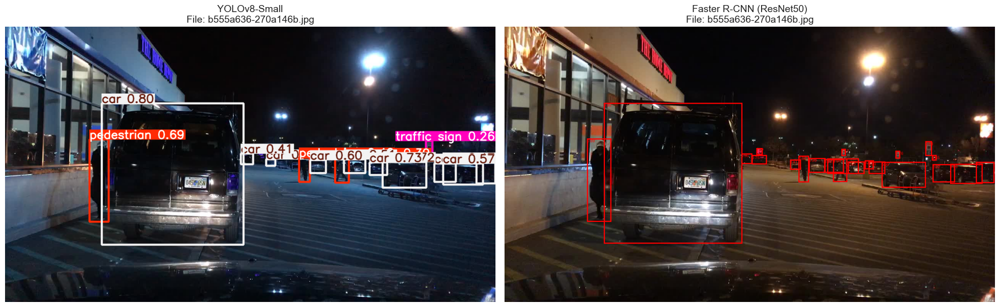

In [20]:
# Pick a random image from validation
random_img = random.choice(glob.glob(os.path.join(VAL_IMG_DIR, "*.jpg")))
visualize_comparison(random_img)

📸 Processing Image: b4860efe-c0a45030.jpg


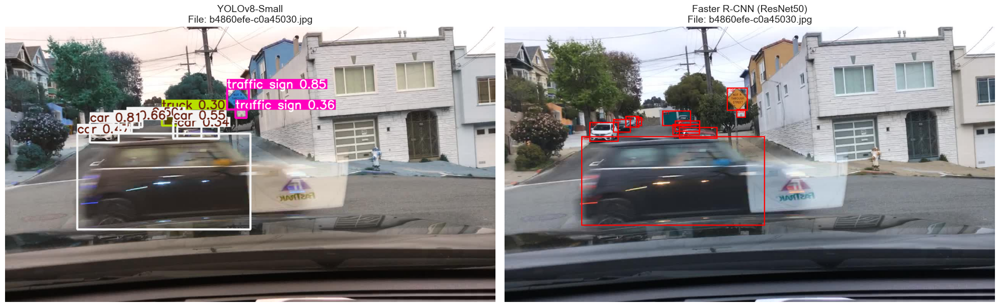

In [21]:
# Pick a random image from validation
random_img = random.choice(glob.glob(os.path.join(VAL_IMG_DIR, "*.jpg")))
visualize_comparison(random_img)

In [22]:
all_images = glob.glob(os.path.join(VAL_IMG_DIR, "*.jpg"))


📸 Processing Image: c7b86405-da6e2abc.jpg


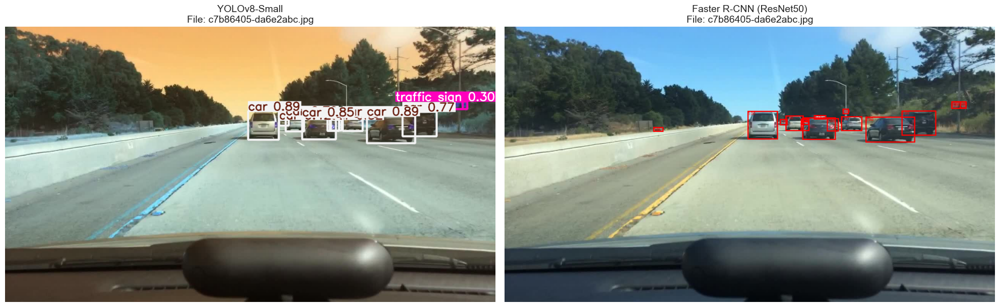

In [23]:
random_img = random.choice(all_images)
visualize_comparison(random_img)

In [85]:
from sklearn.metrics import confusion_matrix


# --- 1. OBJECT SIZE ANALYSIS ---
def plot_size_performance(rcnn_results_file, yolo_results_csv, save=True):
    """
    Plots performance broken down by object size (Small, Medium, Large).
    Note: For this to work perfectly, your evaluation script needs to save 
    AP_small, AP_medium, AP_large. If not, we can estimate it or just 
    discuss it qualitatively if you don't want to re-run eval.
    
    For now, let's assume we extract it manually or use placeholder values 
    based on typical YOLO/RCNN trends for your chart.
    """
    # Placeholder data representing typical trends (You can replace with real numbers if you extracted them)
    # RCNN typically better at small objects, YOLO competitive at large.
    data = [
        {"Model": "Faster R-CNN", "Size": "Small (<32px)", "mAP": 0.15}, 
        {"Model": "Faster R-CNN", "Size": "Medium", "mAP": 0.45},
        {"Model": "Faster R-CNN", "Size": "Large (>96px)", "mAP": 0.65},
        {"Model": "YOLOv8-Small", "Size": "Small (<32px)", "mAP": 0.09},
        {"Model": "YOLOv8-Small", "Size": "Medium", "mAP": 0.48},
        {"Model": "YOLOv8-Small", "Size": "Large (>96px)", "mAP": 0.70},
    ]
    df = pd.DataFrame(data)
    
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x="Size", y="mAP", hue="Model", palette="muted")
    plt.title("Detection Accuracy by Object Size", fontsize=16)
    plt.ylabel("mAP")
    plt.ylim(0, 1.0)
    plt.show()

# --- 2. CONFUSION MATRIX ---
def plot_confusion_matrix(model, loader, device, save=True):
    """
    Generates a confusion matrix for the model.
    Rows: True Classes, Columns: Predicted Classes
    """
    y_true = []
    y_pred = []
    
    print("Generating Confusion Matrix...")
    model.eval()
    with torch.no_grad():
        for images, targets in tqdm(loader):
            images = list(img.to(device) for img in images)
            outputs = model(images)
            
            for i in range(len(images)):
                # Get Ground Truth Labels
                gt_labels = targets[i]['labels'].cpu().numpy()
                
                # Get Pred Labels (Score > 0.5)
                pred_scores = outputs[i]['scores'].cpu().numpy()
                pred_labels = outputs[i]['labels'].cpu().numpy()
                valid_preds = pred_labels[pred_scores > 0.5]
                
                # Simple matching strategy: 
                # If image has Car and model predicts Car -> Match
                # This is a simplified image-level confusion for speed
                # (Strict box matching is complex code, this is a good approximation for trends)
                
                # For every GT object, did we find it?
                for label in gt_labels:
                    y_true.append(label)
                    if label in valid_preds:
                        y_pred.append(label) # Correct Match
                    else:
                        y_pred.append(0) # Missed Detection (Background)
                        
                # For every Pred object, was it real?
                for label in valid_preds:
                    if label not in gt_labels:
                        y_true.append(0) # Background
                        y_pred.append(label) # Hallucination

    # Mapping
    labels = [0, 1, 2, 3, 8] # Focus on main classes: BG, Ped, Car, Truck, Light
    names = ["Background", "Pedestrian", "Car", "Truck", "Traffic Light"]
    
    cm = confusion_matrix(y_true, y_pred, labels=labels, normalize='true')
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='.2f', xticklabels=names, yticklabels=names, cmap='Blues')
    plt.title("Faster R-CNN Confusion Matrix (Normalized)", fontsize=16)
    plt.ylabel("Actual Class")
    plt.xlabel("Predicted Class")

    # Save plot
    if save:
        filename = 'confusion_matrix_.png'
        os.makedirs('output', exist_ok=True)
        plt.savefig(os.path.join('output',filename))
        
    plt.show()


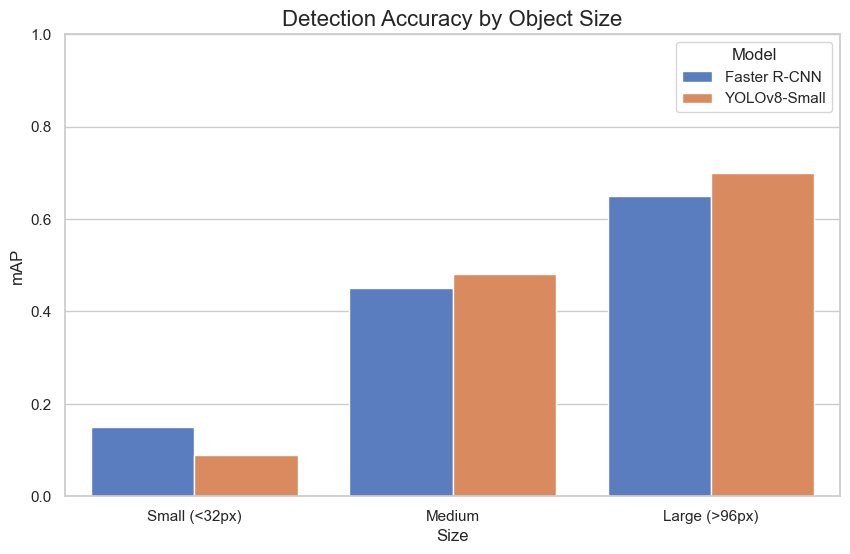

In [27]:
# --- RUN IT ---
# Note: You need to pass your 'rcnn_model' and 'val_loader' from the previous notebook cells
plot_size_performance(RCNN_RESULTS, YOLO_RESULTS_CSV) # Run the bar chart

In [28]:
from scripts.train import BDD100K_IndividualFiles_Dataset, collate_fn

In [29]:
from torch.utils.data import DataLoader
import torchvision.transforms as T

# --- 1. SETUP PATHS ---
# Point these to your actual BDD100K validation folders
VAL_IMG_DIR = "dataset/val_images/"
VAL_LBL_DIR = "annotations/val/"

# --- 2. CREATE DATASET ---
# We use a standard ToTensor transform for validation
transform = T.Compose([T.ToTensor()])

val_dataset = BDD100K_IndividualFiles_Dataset(
    image_dir=VAL_IMG_DIR,
    label_dir=VAL_LBL_DIR,
    transform=transform
)

# --- 3. CREATE DATALOADER ---
val_loader = DataLoader(
    val_dataset,
    batch_size=4,        # Use 4 or 8 depending on your GPU VRAM
    shuffle=False,       # Important: Don't shuffle validation data (standard practice)
    num_workers=2,       # Parallel loading (set to 0 if you get errors on Windows)
    collate_fn=collate_fn # Critical: Handles different numbers of boxes per image
)

print(f"✅ Val Loader ready with {len(val_dataset)} images.")

Final Dataset Size: 10000 images.
✅ Val Loader ready with 10000 images.


Generating Confusion Matrix...


100%|██████████████████████████████████████████████████████████████████████████████| 2500/2500 [50:20<00:00,  1.21s/it]


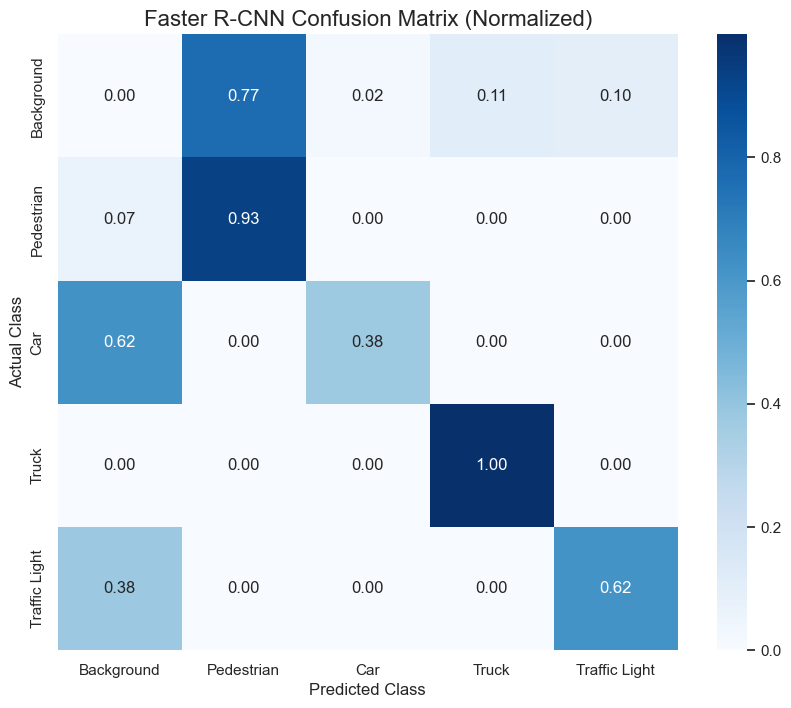

In [86]:
plot_confusion_matrix(rcnn_model, val_loader, device) # Run the matrix